In [14]:
# modified from https://github.com/SherlockLiao/Deep-Dream/blob/master/show_image.ipynb
import torch
import torchvision.models as models
from torchvision import transforms
from PIL import Image
from deepDream import dream
import torch.nn as nn
import spectroUtils as sUtils
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np
import math
from torch.autograd import Variable
from network import *

import matplotlib.pyplot as plt

# Experiments with amp and phase as two channels of same model

In [15]:
#Original hip-hopaudio
trackId = 2
minAmp = -80.0
maxAmp = 1.9073486e-06
audioDirectory = "data/fma_small/"
audioFilename = audioDirectory + "000/000002.mp3"
x, sr = librosa.load(audioFilename, sr=None, mono=True, duration = 10, offset = 0)
start, end = 0, 30
ipd.Audio(data=x[start*sr:end*sr], rate=sr)

scaledSpectro [[113 166 177 ... 207 198 195]
 [103 157 143 ... 172 149 171]
 [121 175 177 ... 180 181 173]
 ...
 [ 18  37  70 ...  56  60 124]
 [ 10  65  45 ...  63  65 124]
 [  0  66  59 ...  65  46 124]]
scaledPhase [[  0  65 210 ...   9  85 134]
 [128 217  64 ... 226  98  39]
 [128 136 129 ... 244 205  16]
 ...
 [128 193 190 ... 236 159 104]
 [255 158  89 ...  23  19  63]
 [128 145  73 ...  14 253  21]]


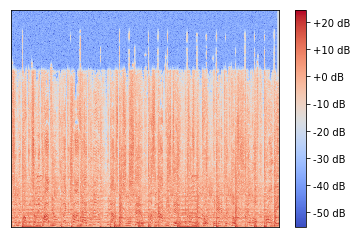

In [16]:
#scaledSpectro, phase, origSpectroSize = sUtils.loadSpectro(trackId, spectroSize, minAmp, maxAmp)
#scaledSpectro = scaledSpectro.data.numpy()
spectro = librosa.core.stft(x)
origMag, origPhase = librosa.core.magphase(spectro)
origSpectroSize = spectro.shape
spectroSize = (512, 512)
scaledSpectro = sUtils.scaleSpectro(librosa.power_to_db(np.abs(spectro)), spectroSize, minAmp, maxAmp)
scaledPhase = sUtils.scalePhase(np.angle(spectro), spectroSize, -math.pi, math.pi)

print("scaledSpectro", scaledSpectro)
print ("scaledPhase", scaledPhase)
#scaledSpectro = scaledSpectro.data.numpy()
#scaledPhase = scaledPhase.data.numpy()

plt.figure()
librosa.display.specshow(librosa.power_to_db(np.abs(spectro)))
plt.colorbar(format='%+2.0f dB')
plt.show()

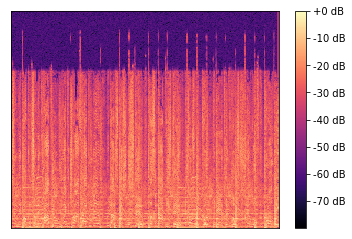

In [17]:
# Scaled version of audio
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(scaledSpectro, origSpectroSize, minAmp, maxAmp))
plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()

In [18]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(scaledPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [19]:
librosa.output.write_wav('scaledExample.wav', y_hat, sr)

In [20]:
scaledSpectro = np.expand_dims(np.expand_dims(scaledSpectro, 0),0).astype(np.float32)
scaledPhase = np.expand_dims(np.expand_dims(scaledPhase, 0),0).astype(np.float32)
scaledSpectroPhase = np.zeros((1,2,scaledSpectro.shape[2], scaledSpectro.shape[3]))
scaledSpectroPhase[0,0,:,:] = scaledSpectro[0,0,:,:]
scaledSpectroPhase[0,1,:,:] = scaledPhase[0,0,:,:]

In [21]:
modelMagPhase = resnet18(channel=2, num_classes=4).cuda()

1


In [22]:
checkpoint = torch.load('new_model/checkpoints/checkpoints_twochannels/model_best.pth.tar')
modelMagPhase.load_state_dict(checkpoint['state_dict'])

modelMagPhase = nn.Sequential(*list(modelMagPhase.children())[:-3])

In [23]:
dreamSpectroPhase = dream(modelMagPhase, scaledSpectroPhase)
dreamSpectro = dreamSpectroPhase[0,0,:]
dreamPhase = dreamSpectroPhase[0,1,:]
print ("dreamSpectro")
print (dreamSpectro.shape)

model after removing 7
(1, 2, 95, 95)
ratio 0.06740567
learning_rate_use 5.9342188093426405
imgBefore [[[[ 1.1288047e+02  1.7958449e+02  1.8805849e+02 ...  1.8991917e+02
     2.0069553e+02  1.9496568e+02]
   [ 1.0984423e+02  1.8454805e+02  1.8777103e+02 ...  2.0452225e+02
     2.0438666e+02  1.9579724e+02]
   [ 1.0259011e+02  1.8178296e+02  1.9258238e+02 ...  1.9964612e+02
     2.0722757e+02  2.0482248e+02]
   ...
   [ 2.4857637e+01  5.9294373e+01  5.7101479e+01 ...  5.8860447e+01
     6.0205688e+01  1.2420533e+02]
   [ 2.1504002e+01  5.8114685e+01  5.6909691e+01 ...  5.7913845e+01
     5.9747490e+01  1.2413623e+02]
   [-1.0041161e-01  5.9473797e+01  5.9276043e+01 ...  5.6627354e+01
     5.7781513e+01  1.2385611e+02]]

  [[ 5.9269559e-01  1.1256374e+02  1.0330021e+02 ...  1.1211154e+02
     1.1860301e+02  1.3417207e+02]
   [ 1.1710115e+02  1.2699123e+02  1.0780391e+02 ...  1.3499796e+02
     1.3504651e+02  8.8764587e+01]
   [ 1.4509906e+02  1.3698868e+02  1.2896201e+02 ...  1.4162198e+

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


ratio 0.06313975
learning_rate_use 6.335153214228989
imgBefore [[[[1.13875160e+02 1.80246582e+02 1.89350021e+02 ... 1.88660126e+02
    2.00941376e+02 1.97556488e+02]
   [1.08817886e+02 1.86460953e+02 1.85081451e+02 ... 2.02895294e+02
    2.04542206e+02 1.95147385e+02]
   [1.04963463e+02 1.80474823e+02 1.91143799e+02 ... 1.98338470e+02
    2.07818634e+02 2.05186218e+02]
   ...
   [2.46573830e+01 6.14020309e+01 5.79239273e+01 ... 6.01028938e+01
    6.05065918e+01 1.23337189e+02]
   [2.03576832e+01 5.88542557e+01 5.71997833e+01 ... 5.75713921e+01
    5.79720764e+01 1.24872482e+02]
   [6.40586019e-02 5.86797867e+01 6.00610657e+01 ... 5.62218056e+01
    5.68647385e+01 1.23485954e+02]]

  [[7.74174392e-01 1.12091362e+02 1.02829514e+02 ... 1.08739021e+02
    1.19453667e+02 1.35037003e+02]
   [1.16662209e+02 1.24597328e+02 1.06745918e+02 ... 1.34701675e+02
    1.33477371e+02 8.66166763e+01]
   [1.42291382e+02 1.36935059e+02 1.28985352e+02 ... 1.38316467e+02
    1.31843124e+02 1.62161240e+02]
 

(1, 2, 133, 133)
ratio 0.07027564
learning_rate_use 5.6918725854746866
imgBefore [[[[115.87026   178.94167   185.21146   ... 190.65251   211.60735
    199.28027  ]
   [106.1016    188.51047   188.68587   ... 210.10362   202.97751
    184.98149  ]
   [111.920235  176.78671   185.31232   ... 202.91846   208.34596
    208.98433  ]
   ...
   [ 18.93354    59.42701    55.935173  ...  57.174103   61.14161
    125.40904  ]
   [ 20.539955   60.247528   59.950493  ...  58.894695   56.592724
    126.38866  ]
   [  0.9028733  61.562634   58.737316  ...  56.962154   58.645103
    123.31128  ]]

  [[ -2.5619352 102.949814  128.92336   ...  99.0798    131.6732
    134.5254   ]
   [116.641174  112.2809    128.18288   ... 133.57562   134.56877
     69.08751  ]
   [114.774124  142.3497    133.20105   ... 155.03917   125.25093
    114.77255  ]
   ...
   [152.80586   133.10431   118.636406  ... 132.49393   146.90958
    111.660645 ]
   [197.38618   126.77569   152.05185   ... 143.44646   112.11697
    12

ratio 0.06719601
learning_rate_use 5.952734259270758
imgBefore [[[[114.799194  179.26149   185.31068   ... 188.93196   210.3939
    197.8748   ]
   [106.28831   186.25308   190.72005   ... 209.90686   201.33896
    184.45885  ]
   [113.380356  178.18295   186.17395   ... 205.20181   211.62238
    207.56268  ]
   ...
   [ 19.271093   61.696903   55.51503   ...  58.16809    61.82599
    125.38079  ]
   [ 19.553797   57.013855   61.393013  ...  59.228554   55.794365
    125.63322  ]
   [  2.1131053  57.763157   58.068268  ...  57.71358    57.856308
    124.01665  ]]

  [[ -1.4490619 104.16535   130.68611   ... 100.61589   132.95169
    134.82169  ]
   [118.11426   113.033676  127.14943   ... 134.407     136.7772
     68.95235  ]
   [116.47159   143.70691   130.49292   ... 158.4803    123.05363
    112.08723  ]
   ...
   [154.83974   134.30293   119.63693   ... 136.94276   147.81941
    110.41005  ]
   [198.86328   128.75273   153.43237   ... 144.8672    113.12793
    125.011215 ]
   [124.

ratio 0.066475496
learning_rate_use 6.017254866798399
imgBefore [[[[1.13700996e+02 1.77044052e+02 1.83315384e+02 ... 2.12513474e+02
    2.09312256e+02 1.97892181e+02]
   [1.11658318e+02 1.82839630e+02 1.80588165e+02 ... 2.10722717e+02
    1.92309906e+02 1.75397842e+02]
   [9.85355072e+01 1.97890839e+02 1.95677399e+02 ... 2.12056656e+02
    2.00018784e+02 1.96309952e+02]
   ...
   [2.76669102e+01 5.94180870e+01 6.19055672e+01 ... 6.05208321e+01
    5.74853020e+01 1.25556953e+02]
   [1.71598759e+01 5.56337395e+01 6.07242241e+01 ... 5.59839897e+01
    5.70178490e+01 1.25066078e+02]
   [3.78895330e+00 5.89327202e+01 5.99659195e+01 ... 5.28700829e+01
    6.10970917e+01 1.22713882e+02]]

  [[1.68159157e-01 7.75386124e+01 1.44766556e+02 ... 1.35799240e+02
    1.26604149e+02 1.35173706e+02]
   [1.28324692e+02 1.28174591e+02 9.20047684e+01 ... 1.52620285e+02
    1.22005814e+02 5.48012581e+01]
   [1.01503448e+02 1.04126610e+02 1.34681183e+02 ... 1.43191559e+02
    1.29489380e+02 9.20012817e+01]


ratio 0.0632719
learning_rate_use 6.321921487819839
imgBefore [[[[114.15489   177.41801   183.4378    ... 215.4697    207.92671
    195.90904  ]
   [112.60854   184.14275   180.1058    ... 210.96332   189.97868
    174.60507  ]
   [ 98.68541   197.56908   194.00714   ... 210.16971   201.057
    195.73386  ]
   ...
   [ 26.608488   59.633503   62.96369   ...  59.776485   58.506653
    124.54189  ]
   [ 14.715235   55.28948    61.024048  ...  53.786404   59.492733
    126.08472  ]
   [  4.2954373  60.0917     58.55899   ...  53.73679    60.356693
    124.28794  ]]

  [[  0.8842999  77.34476   143.81406   ... 133.43938   119.99782
    131.55472  ]
   [123.278984  127.84908    92.03337   ... 147.10477   119.77649
     50.87898  ]
   [100.54276   103.44043   134.56104   ... 139.9764    126.05919
     88.00003  ]
   ...
   [169.15392   120.11738   115.15494   ... 106.3225    109.377495
    110.12877  ]
   [217.7899    135.59698   120.81313   ... 110.69438   110.44554
    133.90544  ]
   [127

ratio 0.05144472
learning_rate_use 7.775336250099297
imgBefore [[[[ 1.12962128e+02  1.75150101e+02  1.80364441e+02 ...  2.14347046e+02
     2.05208755e+02  1.96331131e+02]
   [ 1.15428268e+02  1.75898865e+02  1.77092422e+02 ...  1.85986450e+02
     1.79994293e+02  1.64367096e+02]
   [ 1.07100937e+02  2.00441193e+02  1.82206482e+02 ...  2.06558670e+02
     2.00699646e+02  1.89988052e+02]
   ...
   [ 2.46195354e+01  5.74852104e+01  5.92515564e+01 ...  5.90529594e+01
     5.55657578e+01  1.24270454e+02]
   [ 9.24568844e+00  5.73808517e+01  5.21292915e+01 ...  5.51026115e+01
     6.01113396e+01  1.25151833e+02]
   [-1.37398005e-01  6.15896912e+01  6.07326012e+01 ...  6.61355438e+01
     5.75589981e+01  1.24608482e+02]]

  [[ 1.34827518e+00  1.02694176e+02  3.87444344e+01 ...  1.38472900e+02
     1.06632057e+02  1.32730225e+02]
   [ 1.25492027e+02  1.37453217e+02  1.46003891e+02 ...  7.94550400e+01
     1.35937912e+02  3.62737122e+01]
   [ 1.25709579e+02  1.37274368e+02  6.05247879e+01 ... 

ratio 0.0513562
learning_rate_use 7.788738243812032
imgBefore [[[[1.12541557e+02 1.75623154e+02 1.79411469e+02 ... 2.15635437e+02
    2.06518341e+02 1.96034561e+02]
   [1.16195709e+02 1.74580994e+02 1.75828293e+02 ... 1.86053360e+02
    1.79329163e+02 1.62253616e+02]
   [1.06486740e+02 2.01073166e+02 1.84375671e+02 ... 2.09126526e+02
    2.01221909e+02 1.90963272e+02]
   ...
   [2.48224564e+01 5.77110405e+01 6.02969208e+01 ... 6.06148148e+01
    5.70025597e+01 1.26337708e+02]
   [8.78044319e+00 5.76988716e+01 5.44022751e+01 ... 5.57765198e+01
    6.00540886e+01 1.24841263e+02]
   [1.69042870e-01 6.15976830e+01 6.21188507e+01 ... 6.74975128e+01
    5.69450684e+01 1.25617401e+02]]

  [[1.64665890e+00 1.04620125e+02 4.05500298e+01 ... 1.37996048e+02
    1.07659805e+02 1.31871231e+02]
   [1.22979279e+02 1.37364883e+02 1.47736862e+02 ... 7.85190887e+01
    1.33770752e+02 3.54172783e+01]
   [1.24451065e+02 1.38319504e+02 6.02561378e+01 ... 1.73727798e+02
    9.07167969e+01 7.32381210e+01]
  

ratio 0.040161707
learning_rate_use 9.95973614637691
imgBefore [[[[112.92087   174.36827   178.08076   ... 210.36064   202.61511
    195.93205  ]
   [110.93122   162.2615    170.95215   ... 177.20232   167.68842
    168.25888  ]
   [122.369865  190.35857   190.5245    ... 197.14928   190.93918
    152.38574  ]
   ...
   [  3.2318537  55.010147   64.552025  ...  57.890347   59.18541
    123.91584  ]
   [ 13.80359    56.65325    64.75508   ...  55.859676   61.59214
    124.23372  ]
   [  3.0626867  66.16405    56.016773  ...  66.26191    51.478226
    125.658585 ]]

  [[  2.698422  123.77473    70.92155   ... 193.39896    49.39107
    132.19003  ]
   [125.81161   144.68489   126.88608   ...  96.34095   174.38188
     29.413074 ]
   [124.20427   132.65297   131.5057    ...  62.42599   161.20842
     47.96624  ]
   ...
   [224.69673   135.069     209.14581   ...  50.220528  188.26367
    131.53514  ]
   [200.39368   148.94954   149.48528   ... 131.24022    83.714355
     73.61493  ]
   [12

ratio 0.041780714
learning_rate_use 9.573795232904683
imgBefore [[[[109.51943   173.93468   179.10521   ... 211.17891   202.20992
    193.82072  ]
   [111.81823   162.68843   173.59727   ... 176.81792   169.90457
    170.53326  ]
   [123.09719   189.94507   192.17972   ... 196.867     191.16258
    150.25172  ]
   ...
   [  4.964538   53.52547    64.147964  ...  59.15948    58.802742
    123.418106 ]
   [ 13.435429   56.19912    63.44454   ...  56.187492   59.25991
    124.13895  ]
   [  5.93055    65.99106    57.46752   ...  68.583275   52.093365
    126.42683  ]]

  [[  3.7230413 124.93726    68.502075  ... 195.32874    47.56231
    130.58578  ]
   [123.47713   142.04774   122.757034  ...  96.794075  171.5105
     24.47501  ]
   [119.75229   130.7518    127.78657   ...  63.17965   159.87317
     45.13884  ]
   ...
   [222.0008    132.51923   208.42998   ...  49.261806  184.69748
    128.58043  ]
   [198.55937   144.38052   146.75429   ... 127.265854   83.47452
     72.019005 ]
   [12

ratio 0.03594451
learning_rate_use 11.128264015941497
imgBefore [[[[109.99835   167.27602   180.8792    ... 209.27722   197.96825
    193.82928  ]
   [104.94085   157.87141   147.4694    ... 175.04185   149.78947
    170.36974  ]
   [123.18829   176.20805   180.55931   ... 180.84743   181.18234
    170.30968  ]
   ...
   [ 18.865004   37.915585   70.26958   ...  56.00373    57.76672
    123.85172  ]
   [ 12.914026   67.20825    46.048054  ...  61.30269    64.3001
    124.78362  ]
   [  6.4704485  71.07229    62.29416   ...  64.59081    45.448353
    127.28225  ]]

  [[  4.8047485  70.45739   211.25348   ...   4.969825   81.175934
    132.85097  ]
   [127.361694  216.30936    62.424267  ... 222.39122    94.38433
     36.871914 ]
   [121.77896   130.63689   124.99744   ... 241.40515   200.95987
     12.409221 ]
   ...
   [120.338234  183.7083    179.74498   ... 230.4421    151.40524
     96.19298  ]
   [250.53357   150.70769    80.961205  ...  17.25098    14.641894
     57.29579  ]
   [1

ratio 0.035574384
learning_rate_use 11.244045704946036
imgBefore [[[[109.92398   166.86293   181.3305    ... 207.8139    196.99973
    193.74593  ]
   [105.51941   157.42749   146.27031   ... 175.73627   148.81598
    169.49948  ]
   [122.96611   176.91266   180.10298   ... 180.68169   182.19786
    170.44052  ]
   ...
   [ 17.837055   37.780594   68.4935    ...  56.466335   58.50564
    123.736595 ]
   [ 13.187231   66.70183    45.418262  ...  62.539825   62.583015
    123.60386  ]
   [  6.5237937  72.65382    62.896526  ...  64.72156    44.863228
    127.05371  ]]

  [[  3.5250297  70.88692   211.70798   ...   4.1326885  80.90654
    131.7157   ]
   [128.61047   215.33954    63.17419   ... 221.43721    94.97293
     39.003098 ]
   [120.64735   131.69722   125.89281   ... 240.46492   201.54103
     10.637117 ]
   ...
   [122.34618   183.6483    178.63585   ... 230.86536   151.37521
     95.83068  ]
   [251.77017   151.84276    81.6788    ...  16.517937   14.174041
     57.553562 ]
   

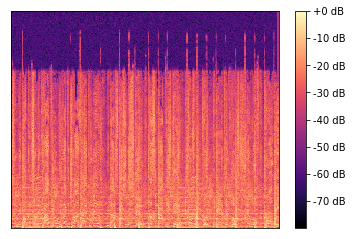

In [24]:
#Convert dream back to audio
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(dreamSpectro, origSpectroSize, minAmp, maxAmp))
plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()

In [25]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(dreamPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [26]:
librosa.output.write_wav('dreamExample.wav', y_hat, sr)

## Noise Dream

In [27]:
noiseSpectro = np.random.random(spectroSize)*255
noisePhase = np.random.random(spectroSize)*2*math.pi - math.pi
backToNoiseSpectro = librosa.core.db_to_power(sUtils.unscaleSpectro(noiseSpectro, origSpectroSize, minAmp, maxAmp))
backToNoisePhase = sUtils.unscalePhase(noisePhase, origSpectroSize, -math.pi, math.pi)
invStftNoise = np.zeros(backToNoiseSpectro.shape, dtype=np.complex_)
for i in range(invStftNoise.shape[0]):
    for j in range(invStftNoise.shape[1]):
        invStftNoise[i,j] = complex(backToNoiseSpectro[i,j]*math.cos(backToNoisePhase[i,j]), backToNoiseSpectro[i,j]*math.sin(backToNoisePhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStftNoise, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)


In [28]:
noiseSpectro = np.expand_dims(np.expand_dims(noiseSpectro, 0),0).astype(np.float32)
noisePhase = np.expand_dims(np.expand_dims(noisePhase, 0),0).astype(np.float32)
noiseSpectroPhase = np.zeros((1,2,noiseSpectro.shape[2], noiseSpectro.shape[3]))
noiseSpectroPhase[0,0,:,:] = noiseSpectro[0,0,:,:]
noiseSpectroPhase[0,1,:,:] = noisePhase[0,0,:,:]

In [29]:
modelMagPhase = resnet18(channel=2, num_classes=4).cuda()

1


In [30]:
checkpoint = torch.load('new_model/checkpoints/checkpoints_twochannels/model_best.pth.tar')
modelMagPhase.load_state_dict(checkpoint['state_dict'])

modelMagPhase = nn.Sequential(*list(modelMagPhase.children())[:-3])

In [31]:
dreamNoiseSpectroPhase = dream(modelMagPhase, noiseSpectroPhase)
dreamNoiseSpectro = dreamNoiseSpectroPhase[0,0,:]
dreamNoisePhase = dreamNoiseSpectroPhase[0,1,:]
print ("dreamNoiseSpectro")
print (dreamNoiseSpectro)

model after removing 7
(1, 2, 95, 95)
ratio 0.32070506
learning_rate_use 1.2472519290821849
imgBefore [[[[ 5.38101387e+00  1.41733490e+02  8.10033951e+01 ...  1.14314850e+02
     1.47391708e+02  1.39493580e+01]
   [ 1.32174957e+02  1.29426971e+02  1.40202820e+02 ...  1.29360397e+02
     1.28355453e+02  1.86381714e+02]
   [ 1.76840912e+02  1.27463127e+02  1.28220596e+02 ...  9.95233536e+01
     1.18873222e+02  1.90154922e+02]
   ...
   [ 9.61363297e+01  1.36604156e+02  1.28059311e+02 ...  1.15008881e+02
     1.19802780e+02  1.00174156e+02]
   [ 1.23826324e+02  1.20073166e+02  1.07838486e+02 ...  1.13092720e+02
     1.31420975e+02  1.30318695e+02]
   [ 4.36797600e+01  1.34562973e+02  9.11352997e+01 ...  1.15279388e+02
     1.10872185e+02  1.62459427e+02]]

  [[-1.18438482e+00 -6.34011745e-01  8.41352940e-01 ...  1.56062472e+00
     1.82634902e+00  6.68374598e-02]
   [-9.57174778e-01 -5.65559983e-01 -3.58309656e-01 ...  3.47958773e-01
     8.81624222e-02 -5.74646711e-01]
   [ 1.10543668e+

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


(1, 2, 95, 95)
ratio 0.26033473
learning_rate_use 1.5364834333556487
imgBefore [[[[ 5.31674767e+00  1.40072769e+02  8.07376328e+01 ...  1.15715675e+02
     1.49357971e+02  1.44488497e+01]
   [ 1.34777267e+02  1.29047745e+02  1.40045654e+02 ...  1.29143356e+02
     1.28198257e+02  1.84989014e+02]
   [ 1.75930313e+02  1.27967453e+02  1.29831482e+02 ...  9.85130310e+01
     1.19686928e+02  1.88591354e+02]
   ...
   [ 9.61483536e+01  1.34659058e+02  1.27440102e+02 ...  1.15607872e+02
     1.18966637e+02  1.01700050e+02]
   [ 1.24494034e+02  1.19096504e+02  1.07593063e+02 ...  1.12762215e+02
     1.32306656e+02  1.30953293e+02]
   [ 4.30175629e+01  1.35094650e+02  8.93433304e+01 ...  1.15572815e+02
     1.10328247e+02  1.60986374e+02]]

  [[ 1.48740292e+00 -4.14918137e+00  7.13694215e-01 ...  6.50429368e-01
     1.47717118e+00  2.90255165e+00]
   [-1.20338893e+00 -2.56654572e+00 -2.45044112e-01 ...  1.25489390e+00
     2.52956653e+00  1.48132741e-02]
   [ 2.13007832e+00 -5.17578554e+00 -8.9

(1, 2, 133, 133)
ratio 0.21159631
learning_rate_use 1.890392132725746
imgBefore [[[[ 4.68067455e+00  1.49448975e+02  1.25726585e+02 ...  1.35460175e+02
     1.58951202e+02  1.37004986e+01]
   [ 1.44245041e+02  1.14725304e+02  1.41436600e+02 ...  1.29341537e+02
     1.31715424e+02  1.74685226e+02]
   [ 1.15904633e+02  1.25431381e+02  1.47147385e+02 ...  1.20769836e+02
     1.26907013e+02  2.00422806e+02]
   ...
   [ 1.17695564e+02  1.32553925e+02  1.20859779e+02 ...  1.30025085e+02
     1.31019089e+02  1.12335793e+02]
   [ 1.29338913e+02  1.12435005e+02  1.19492889e+02 ...  1.39448837e+02
     1.28933990e+02  1.44606888e+02]
   [ 4.29868011e+01  1.69458389e+02  8.27524796e+01 ...  1.21080673e+02
     1.05280128e+02  1.61585953e+02]]

  [[ 1.90769708e+00 -3.99321628e+00 -4.75589323e+00 ...  4.10995436e+00
     4.60498285e+00  5.19969463e+00]
   [ 1.51668513e+00 -2.91844797e+00 -3.42507029e+00 ...  4.11208391e+00
     4.93224049e+00  1.57083869e+00]
   [ 5.68535209e-01 -2.61159515e+00 -4.

ratio 0.19373927
learning_rate_use 2.064630520715031
imgBefore [[[[  4.306777   146.95679    126.53811    ... 135.86179
    158.76767     17.933037  ]
   [142.33794    114.84805    143.87329    ... 129.60541
    131.72209    175.4468    ]
   [115.56332    123.41248    146.8227     ... 120.47938
    126.976746   199.0749    ]
   ...
   [118.668396   132.17235    120.26997    ... 131.33038
    131.24554    111.761894  ]
   [129.58473    113.29783    118.957664   ... 138.9056
    130.13478    144.48436   ]
   [ 43.698444   169.62253     82.17383    ... 121.31172
    105.665504   160.85881   ]]

  [[  2.9761596   -3.5329022   -5.0420575  ...   2.4024
      3.1329665    4.495644  ]
   [  3.4747415   -1.657706    -4.642159   ...   1.3220494
      2.58782      4.5970316 ]
   [  1.4710815   -0.2222737   -1.5031333  ...   0.24284041
      3.3289194    0.39495057]
   ...
   [  2.0938401    3.4931355    2.1109648  ...  -1.807764
      0.48108745  -2.1775565 ]
   [ -1.8827485    3.6199293    2.156

ratio 0.17466435
learning_rate_use 2.2901067318367936
imgBefore [[[[ 5.02205467e+00  1.63070129e+02  1.25162895e+02 ...  1.85794327e+02
     1.39540817e+02  1.82808647e+01]
   [ 1.24546158e+02  1.21920769e+02  1.15743500e+02 ...  9.89853821e+01
     1.43992401e+02  1.80056488e+02]
   [ 1.69210312e+02  9.31694794e+01  1.29011841e+02 ...  1.45758636e+02
     1.33099411e+02  1.69668457e+02]
   ...
   [ 1.41052673e+02  1.23129326e+02  1.11575737e+02 ...  1.08361038e+02
     1.32076340e+02  1.89471603e+02]
   [ 1.23037651e+02  1.08124779e+02  1.12329681e+02 ...  1.22836777e+02
     1.41339432e+02  1.11990730e+02]
   [ 4.51531296e+01  1.80108261e+02  1.54117691e+02 ...  8.29943695e+01
     1.21046860e+02  1.61393951e+02]]

  [[ 1.04900503e+00 -3.61046696e+00 -7.13543653e+00 ...  1.92678094e+00
     4.32619238e+00  3.61759377e+00]
   [-1.95289522e-01 -3.42457128e+00 -5.93065739e+00 ...  2.05074406e+00
     5.45027018e+00  1.70296502e+00]
   [-7.18512833e-02 -2.45041370e+00 -4.84840965e+00 ...

ratio 0.14202316
learning_rate_use 2.8164420298241124
imgBefore [[[[ 6.99654579e+00  1.62333084e+02  1.25903496e+02 ...  1.86240158e+02
     1.39339203e+02  1.93399620e+01]
   [ 1.24816444e+02  1.22517990e+02  1.15225403e+02 ...  9.87628326e+01
     1.42935562e+02  1.78878357e+02]
   [ 1.68545609e+02  9.32101288e+01  1.27709198e+02 ...  1.45513504e+02
     1.33013046e+02  1.68902786e+02]
   ...
   [ 1.39661285e+02  1.23060486e+02  1.10985809e+02 ...  1.06437309e+02
     1.32855225e+02  1.89170486e+02]
   [ 1.24047859e+02  1.08211349e+02  1.12612839e+02 ...  1.23815819e+02
     1.41585739e+02  1.10688446e+02]
   [ 4.68248520e+01  1.80191299e+02  1.53374832e+02 ...  8.46315994e+01
     1.21729149e+02  1.60062347e+02]]

  [[ 9.51046705e-01 -5.37033796e+00 -7.87476444e+00 ...  4.64732707e-01
     3.07068706e+00  2.86109281e+00]
   [-1.75228298e+00 -3.08743191e+00 -6.28805828e+00 ...  1.35634053e+00
     2.74725056e+00  1.12473381e+00]
   [-1.14523441e-01  1.41953886e-01 -5.01490164e+00 ...

ratio 0.11437656
learning_rate_use 3.4972200642522795
imgBefore [[[[ 7.40337706e+00  1.57059525e+02  1.73053406e+02 ...  1.89130417e+02
     1.06929016e+02  2.09665051e+01]
   [ 8.02974319e+01  1.47916397e+02  1.12279381e+02 ...  1.18057281e+02
     1.11088356e+02  2.17524109e+02]
   [ 1.89069992e+02  7.93270493e+01  1.41721924e+02 ...  1.84414841e+02
     1.90298019e+02  1.21793884e+02]
   ...
   [ 1.27247375e+02  1.40940781e+02  9.63545761e+01 ...  1.41146713e+02
     1.44992249e+02  1.56013718e+02]
   [ 1.21477531e+02  1.14513535e+02  7.37237473e+01 ...  1.22654221e+02
     1.52552963e+02  8.10186539e+01]
   [ 4.73181877e+01  1.81410355e+02  1.79370377e+02 ...  3.06416035e+01
     1.82608749e+02  1.60722931e+02]]

  [[ 3.84234881e+00 -3.88180518e+00 -5.53213882e+00 ...  1.11822259e+00
     3.63526201e+00  2.90344906e+00]
   [ 7.67262697e-01 -2.38581657e+00 -5.99893188e+00 ...  1.67845738e+00
     1.90500009e+00  1.02644062e+00]
   [-1.50338340e+00 -1.69034052e+00 -4.56637096e+00 ...

ratio 0.09347328
learning_rate_use 4.279297876551389
imgBefore [[[[ 8.26902008e+00  1.55724060e+02  1.72425827e+02 ...  1.88906784e+02
     1.06683708e+02  2.13929310e+01]
   [ 8.00377274e+01  1.49288513e+02  1.13054749e+02 ...  1.17394600e+02
     1.11752159e+02  2.17320587e+02]
   [ 1.88493988e+02  7.98474655e+01  1.40045639e+02 ...  1.83180161e+02
     1.90269333e+02  1.21831108e+02]
   ...
   [ 1.26575935e+02  1.41825821e+02  9.64802704e+01 ...  1.40558838e+02
     1.44866043e+02  1.55842041e+02]
   [ 1.21405800e+02  1.15951721e+02  7.47832413e+01 ...  1.22746140e+02
     1.51495773e+02  8.14524689e+01]
   [ 4.81227493e+01  1.80050064e+02  1.79362976e+02 ...  3.14474850e+01
     1.81822464e+02  1.61737015e+02]]

  [[ 7.05374527e+00 -1.32937288e+00 -2.49429798e+00 ...  1.07338512e+00
     4.39952660e+00  3.06183457e+00]
   [ 1.63838458e+00  4.19018388e-01 -5.48262596e+00 ... -3.67347658e-01
     1.06863880e+00  6.32817268e-01]
   [-8.91201675e-01 -1.79120377e-01 -3.11455989e+00 ... 

(1, 2, 366, 366)
ratio 0.080403425
learning_rate_use 4.974912461723578
imgBefore [[[[ 8.66598511e+00  1.31563019e+02  1.95162491e+02 ...  1.09096428e+02
     1.06332939e+02  2.09457226e+01]
   [ 9.60081863e+01  1.83882339e+02  8.50965271e+01 ...  1.62443466e+02
     6.84219589e+01  2.20110687e+02]
   [ 5.77730484e+01  1.48467621e+02  1.66597427e+02 ...  9.86735840e+01
     1.35293198e+02  2.15320328e+02]
   ...
   [ 1.53332092e+02  8.52056274e+01  7.17690659e+01 ...  1.56003311e+02
     1.26116936e+02  4.18463936e+01]
   [ 9.96386108e+01  1.12492599e+02  1.79592270e+02 ...  1.28085129e+02
     1.83971069e+02  1.08332298e+02]
   [ 4.78608360e+01  1.79117798e+02  1.82605835e+02 ...  1.22610291e+02
     2.22951157e+02  1.62000595e+02]]

  [[ 7.31152153e+00  3.58342588e-01 -1.33459282e+00 ...  4.73820400e+00
     5.07163334e+00  3.98889875e+00]
   [ 4.21112776e+00  1.42808485e+00 -2.59480286e+00 ...  3.79393888e+00
     3.80457759e+00 -1.04044688e+00]
   [-1.12164712e+00  7.03586519e-01 -2

ratio 0.06718104
learning_rate_use 5.954060553270769
imgBefore [[[[ 9.14776707e+00  1.31220963e+02  1.95449051e+02 ...  1.09644295e+02
     1.06225319e+02  2.17783909e+01]
   [ 9.60425110e+01  1.85182770e+02  8.52918777e+01 ...  1.62088623e+02
     6.81550674e+01  2.19924637e+02]
   [ 5.86570320e+01  1.47939957e+02  1.65447678e+02 ...  9.88875275e+01
     1.37437531e+02  2.15706177e+02]
   ...
   [ 1.52398056e+02  8.46536026e+01  7.17309723e+01 ...  1.55311935e+02
     1.25810623e+02  4.41782837e+01]
   [ 1.00941978e+02  1.12688179e+02  1.79434158e+02 ...  1.28969208e+02
     1.82622726e+02  1.07539764e+02]
   [ 4.80344582e+01  1.79484695e+02  1.82370743e+02 ...  1.21878769e+02
     2.22980209e+02  1.61247849e+02]]

  [[ 4.75365305e+00  1.41683042e+00 -3.05538625e-01 ...  6.21829224e+00
     6.09883165e+00  4.02119541e+00]
   [ 3.77659488e+00  2.78602958e+00 -2.19874287e+00 ...  3.74219036e+00
     3.69826508e+00 -4.28450584e-01]
   [-1.14746368e+00  1.47509122e+00 -3.66288376e+00 ... 

ratio 0.0634688
learning_rate_use 6.302309265870906
imgBefore [[[[ 9.34881210e+00  1.31193726e+02  1.95898331e+02 ...  1.09518188e+02
     1.07363281e+02  2.20654564e+01]
   [ 9.59000473e+01  1.86096863e+02  8.65713120e+01 ...  1.62700287e+02
     6.84237595e+01  2.20710449e+02]
   [ 5.88501701e+01  1.47247574e+02  1.65758636e+02 ...  9.82526932e+01
     1.38062653e+02  2.16616943e+02]
   ...
   [ 1.52313553e+02  8.60512238e+01  7.15317459e+01 ...  1.53887466e+02
     1.25704056e+02  4.44024391e+01]
   [ 1.01360771e+02  1.12434891e+02  1.78950012e+02 ...  1.28998001e+02
     1.82643250e+02  1.08353294e+02]
   [ 4.86127472e+01  1.79279221e+02  1.82654037e+02 ...  1.21624069e+02
     2.23782822e+02  1.61223572e+02]]

  [[ 4.53331518e+00  1.47916162e+00 -4.66138810e-01 ...  6.55339432e+00
     5.37653208e+00  3.57836461e+00]
   [ 3.56611109e+00  2.14949107e+00 -3.20893860e+00 ...  2.67170095e+00
     3.74799848e+00  5.13524532e-01]
   [-2.34971523e+00  1.62309384e+00 -3.37492371e+00 ...  

ratio 0.053888626
learning_rate_use 7.422716568348481
imgBefore [[[[  9.66018     88.58803    197.05956    ...  55.291885
    142.93011     21.8477    ]
   [129.63428    181.32999    183.25267    ... 197.68808
     30.497122   204.37555   ]
   [ 45.966213   227.21768    135.62817    ...  55.421925
      6.6524124  246.14426   ]
   ...
   [ 25.7775      93.954        5.721006   ...  87.899
    172.89087    105.5783    ]
   [151.384      168.51799    116.69422    ... 197.19571
    226.08029    110.649704  ]
   [ 48.94432    184.82574    172.13673    ... 211.98271
    231.26985    161.85219   ]]

  [[  5.195535     1.7268474   -0.5358557  ...   6.9849763
      5.894204     5.3223596 ]
   [  6.040597     2.831401    -1.5567034  ...   6.3684344
      3.3188827    3.099849  ]
   [  3.7320323    3.11164     -0.47780383 ...   1.6226261
      6.179951     2.6772044 ]
   ...
   [ -5.2847657   -2.8719187    2.1632168  ...  -1.4212351
      3.4079802    3.452734  ]
   [ -2.6183214   -1.3758196    

ratio 0.049223475
learning_rate_use 8.12620398527971
imgBefore [[[[ 10.047372    88.53827    196.7393     ...  55.55774
    143.2258      22.292288  ]
   [129.18053    180.45958    183.60995    ... 198.20148
     31.543608   204.0646    ]
   [ 45.697445   227.31163    135.33408    ...  55.749386
      6.039602   245.92987   ]
   ...
   [ 25.953793    93.9132       5.7653217  ...  86.25729
    173.19075    105.58779   ]
   [151.73445    168.25133    116.06773    ... 197.15681
    226.31598    110.55081   ]
   [ 49.34176    183.87715    171.71959    ... 212.16818
    231.91115    163.10516   ]]

  [[  3.7975767    0.5498175    1.6181864  ...   8.171688
      6.6107626    6.4212875 ]
   [  6.641675     5.2534323    0.40983778 ...   7.3020086
      4.4302487    4.597369  ]
   [  3.711662     4.084897     0.29134473 ...   2.39959
      6.0721507    2.4927926 ]
   ...
   [ -5.6598244   -2.3783183    3.2568285  ...  -1.2702551
      2.9819007    3.0897346 ]
   [ -2.238304    -1.9027734    2.3

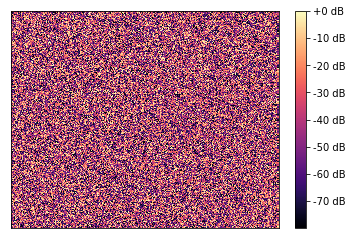

In [32]:
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(dreamNoiseSpectro, origSpectroSize, minAmp, maxAmp))
plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()

In [33]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(dreamPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [34]:
librosa.output.write_wav('dreamNoiseExample.wav', y_hat, sr)

## Control The Dream

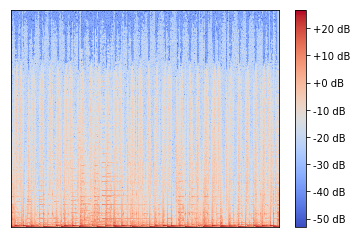

In [77]:
#spectroSize = 224
otherTrackId = 1482
audioFilename = audioDirectory + "001/001482.mp3"
x, sr = librosa.load(audioFilename, sr=None, mono=True, duration = 10, offset = 0)

otherSpectro = librosa.core.stft(x)
origSpectroSize = spectro.shape
spectroSize = (512, 512)
otherScaledSpectro = librosa.power_to_db(np.abs(otherSpectro))

plt.figure()
librosa.display.specshow(otherScaledSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()


In [78]:
otherScaledSpectro = sUtils.scaleSpectro(otherScaledSpectro, spectroSize, minAmp, maxAmp)
otherScaledPhase = sUtils.scalePhase(np.angle(otherSpectro), spectroSize, -math.pi, math.pi)

start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)

In [79]:
modelMagPhase = resnet18(channel=2, num_classes=4).cuda()
checkpoint = torch.load('new_model/checkpoints/checkpoints_twochannels/model_best.pth.tar')
modelMagPhase.load_state_dict(checkpoint['state_dict'])

modelMagPhase = nn.Sequential(*list(modelMagPhase.children())[:-5])

1


In [80]:
otherScaledSpectroPhase = np.zeros((1,2,otherScaledSpectro.shape[0], otherScaledSpectro.shape[1]))
otherScaledSpectroPhase[0,0,:,:] = otherScaledSpectro
otherScaledSpectroPhase[0,1,:,:] = otherScaledPhase
otherScaledSpectroPhase = torch.Tensor(otherScaledSpectroPhase).cuda()
otherScaledSpectroPhase = Variable(otherScaledSpectroPhase)

control_features_magPhase = modelMagPhase.forward(otherScaledSpectroPhase)
control_features_magPhase = control_features_magPhase.cpu().data.numpy()


In [81]:
def objective_guide(dst, guide_features):
    x = dst.data[0].cpu().numpy().copy()
    #print ("guide_features", guide_features.shape)
    y = guide_features
    ch,w, h = x.shape
    #ch = 1
    x = x.reshape(ch,-1)
    y = y.reshape(ch,-1)
    print ("shape of x", x.shape)
    print ("shape of y", y.shape)
    #A = x.T.dot(y) # compute the matrix of dot-products with guide features
    #A = torch.mm(torch.from_numpy(x.T).type(torch.DoubleTensor), torch.from_numpy(y).type(torch.DoubleTensor)).numpy()
    #A = np.zeros((x.shape[1],y.shape[1]))
    '''maxColumnIndices = []
    batchSize = 9000
    numBatches = x.shape[1]//batchSize
    for batchNum in range(numBatches):
        start = batchNum*batchSize
        end = start+batchSize
        if batchNum == numBatches-1:
            end = x.shape[1]
        #print ("x portion shape", (x[0,start:end].T).shape)
        #print ("y portion shape", (y).shape)
        prod = np.dot((x[0,start:end].T).reshape(-1,1), y)
        argMax = prod.argmax(1)
        for val in list(argMax):
            maxColumnIndices.append(val)
        del prod
    #print ("shape of A", A.shape)
    #result = y[:,A.argmax(1)] # select ones that match best
    #print ("shape of result", result.shape)
    result = y[:,maxColumnIndices]'''
    A = x.T.dot(y) # compute the matrix of dot-products with guide features
    result = y[:,A.argmax(1)] # select ones that match best
    print ("shape of result", result.shape)
    if torch.cuda.is_available():
        result = torch.Tensor(np.array([result.reshape(ch, w, h)], dtype=np.float)).cuda()
    else:
        result = torch.Tensor(np.array([result.reshape(ch, w, h)], dtype=np.float))
    return result

In [82]:
hopRockDreamSpectroPhase = dream(modelMagPhase, scaledSpectroPhase, control=control_features_magPhase, distance=objective_guide, layerNumber=3)
hopRockDreamSpectro = hopRockDreamSpectroPhase[0,0,:]
hopRockDreamPhase = hopRockDreamSpectroPhase[0,1,:]
print(hopRockDreamSpectro)

model after removing 5
(1, 2, 95, 95)
shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.2134221
learning_rate_use 1.874220107292609
imgBefore [[[[ 1.13039909e+02  1.79046448e+02  1.87406281e+02 ...  1.90262772e+02
     2.00695084e+02  1.95011780e+02]
   [ 1.10146698e+02  1.84731064e+02  1.87493301e+02 ...  2.04974854e+02
     2.04555054e+02  1.95947952e+02]
   [ 1.03057091e+02  1.81479858e+02  1.91846939e+02 ...  1.99509048e+02
     2.07490967e+02  2.05154800e+02]
   ...
   [ 2.52437248e+01  5.89635124e+01  5.71657486e+01 ...  5.85860977e+01
     6.02766075e+01  1.24072243e+02]
   [ 2.12543259e+01  5.86681328e+01  5.73004570e+01 ...  5.79389267e+01
     5.97206230e+01  1.24046227e+02]
   [-4.35451465e-03  5.92660828e+01  5.93156700e+01 ...  5.67780609e+01
     5.77098160e+01  1.23988144e+02]]

  [[-3.66633505e-01  1.12927719e+02  1.02598846e+02 ...  1.12117210e+02
     1.19238869e+02  1.33920502e+02]
   [ 1.16747070e+02  1.27642548e+02  1.07360672e+02 ...  1

/home/iaakhter/.conda/envs/mypy35/lib/python3.5/site-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


 (64, 576)
ratio 0.20153461
learning_rate_use 1.984770715692605
imgBefore [[[[112.64974   179.34401   188.33275   ... 189.94849   200.89613
    194.44768  ]
   [109.48634   185.75287   187.76418   ... 205.26802   205.80626
    195.82     ]
   [102.73864   181.7414    191.43575   ... 199.43408   207.63567
    204.67056  ]
   ...
   [ 25.549149   59.056904   56.439896  ...  58.212673   60.03321
    124.28543  ]
   [ 20.583685   58.832672   57.50349   ...  57.33111    60.14222
    124.635506 ]
   [ -0.6789566  59.618378   59.33406   ...  55.868816   57.200443
    124.43084  ]]

  [[ -1.3392432 112.735214  102.81522   ... 111.590454  120.09648
    135.21442  ]
   [117.00363   128.06783   107.15735   ... 134.00099   136.30592
     89.38029  ]
   [145.71828   137.96536   129.28395   ... 141.22206   134.68059
    163.95914  ]
   ...
   [ 72.00488   131.46893   103.664536  ... 113.14655   143.88281
    126.25101  ]
   [182.06271   135.1475    126.78182   ... 143.18073   132.72408
    119.78503

shape of x (64, 576)
shape of y (64, 16384)
shape of result (64, 576)
ratio 0.19370842
learning_rate_use 2.0649592847507363
imgBefore [[[[111.481445   178.5999     189.38243    ... 188.8052
    202.28796    194.75864   ]
   [109.993416   188.33412    190.39432    ... 205.93137
    208.05847    195.56087   ]
   [100.737434   183.28282    193.5411     ... 200.95299
    209.03603    203.22273   ]
   ...
   [ 25.354479    58.05837     56.59704    ...  59.984974
     62.82588    125.498665  ]
   [ 19.540691    59.243378    54.52349    ...  56.983944
     61.677914   124.57341   ]
   [ -0.44796002  58.573685    58.68141    ...  54.016445
     55.371105   123.65719   ]]

  [[ -7.2878456  111.57786    105.41249    ... 114.120026
    122.71548    134.0609    ]
   [112.45063    131.47226    108.67318    ... 137.00775
    139.96635     88.76783   ]
   [152.14726    140.92874    130.81734    ... 148.77132
    139.43272    170.8092    ]
   ...
   [ 71.18739    131.2103     103.42306    ... 115.8839

shape of result (64, 576)
ratio 0.16708092
learning_rate_use 2.394049485886918
imgBefore [[[[ 1.11378540e+02  1.77911179e+02  1.90158127e+02 ...  1.89381088e+02
     2.02343155e+02  1.94738068e+02]
   [ 1.09828636e+02  1.89244995e+02  1.91563736e+02 ...  2.05780334e+02
     2.06970169e+02  1.95582687e+02]
   [ 9.89274063e+01  1.83536072e+02  1.95301666e+02 ...  1.99879471e+02
     2.10461792e+02  2.03483093e+02]
   ...
   [ 2.50282955e+01  5.83989449e+01  5.79345589e+01 ...  6.13072281e+01
     6.50331726e+01  1.26882858e+02]
   [ 2.05110264e+01  5.74394913e+01  5.47605057e+01 ...  5.60162621e+01
     6.18937073e+01  1.23560074e+02]
   [ 8.04966837e-02  5.86022263e+01  5.78082275e+01 ...  5.34462585e+01
     5.36024895e+01  1.23819305e+02]]

  [[-1.19604073e+01  1.10648872e+02  1.06496506e+02 ...  1.10139694e+02
     1.21163521e+02  1.32322464e+02]
   [ 1.10599174e+02  1.34550339e+02  1.09736603e+02 ...  1.37100906e+02
     1.39180481e+02  8.65741425e+01]
   [ 1.54873764e+02  1.4369075

shape of x (64, 1156)
shape of y (64, 16384)
shape of result (64, 1156)
ratio 0.1488616
learning_rate_use 2.687059622922396
imgBefore [[[[110.119774  174.40031   184.97795   ... 190.81546   212.89139
    191.9193   ]
   [107.843216  188.67574   192.67293   ... 211.51524   204.07806
    184.92537  ]
   [109.739784  178.27739   188.42311   ... 203.07576   208.87813
    209.60127  ]
   ...
   [ 17.668278   58.006817   54.756184  ...  61.057465   68.98905
    127.02587  ]
   [ 23.020182   58.11803    58.91942   ...  60.262196   58.66872
    124.54801  ]
   [  0.9640329  61.95933    58.946846  ...  54.062782   58.806934
    124.44486  ]]

  [[-18.258839   94.40362   128.34949   ... 101.40985   132.30702
    130.52673  ]
   [106.109924  115.12742   132.11455   ... 137.52164   134.70468
     67.134384 ]
   [115.40737   146.97433   140.1372    ... 164.76001   131.50623
    120.025696 ]
   ...
   [158.59048   137.45406   121.84308   ... 143.92093   155.89706
    116.29247  ]
   [204.51213   129

ratio 0.13463221
learning_rate_use 2.971057115013091
imgBefore [[[[108.720955   174.70866    185.29546    ... 190.53006
    214.92737    191.29991   ]
   [108.13348    188.62279    195.94507    ... 211.61276
    205.40019    183.46788   ]
   [109.132614   178.2174     190.36754    ... 202.63
    208.95172    208.61182   ]
   ...
   [ 18.09448     57.54191     55.588463   ...  63.52098
     71.46629    129.31068   ]
   [ 23.817404    57.97878     59.34818    ...  58.68249
     59.45817    125.19407   ]
   [  0.25183538  63.463665    59.522545   ...  53.02322
     57.66244    124.35678   ]]

  [[-24.331444    91.09329    127.7599     ...  96.48682
    131.83084    126.24596   ]
   [102.49013    114.94267    129.97482    ... 137.09804
    135.01128     64.42272   ]
   [113.90588    146.8429     138.01555    ... 163.58253
    131.37614    118.85552   ]
   ...
   [161.32802    140.848      123.51362    ... 148.44727
    160.24777    119.24521   ]
   [210.67162    133.41444    157.30028    .

shape of x (64, 2209)
shape of y (64, 16384)
shape of result (64, 2209)
ratio 0.13852857
learning_rate_use 2.887490995262193
imgBefore [[[[108.31401   170.37988   180.99007   ... 217.88138   215.16943
    191.03186  ]
   [111.45248   182.63078   183.93918   ... 214.95287   198.49268
    173.34308  ]
   [ 98.074715  197.09732   196.72812   ... 215.14633   203.41982
    196.59671  ]
   ...
   [ 30.647644   58.555443   60.46021   ...  64.743484   63.510933
    129.16104  ]
   [ 18.706125   57.84937    62.996178  ...  57.702763   59.07662
    125.92001  ]
   [  0.9468365  63.2842     63.963573  ...  50.579884   62.519
    124.93842  ]]

  [[-32.359684   52.649788  132.00238   ... 138.91028   122.05688
    121.56481  ]
   [106.97302   116.25173    91.6546    ... 153.12927   120.587944
     47.040173 ]
   [ 88.39773   103.46681   139.12881   ... 146.3092    133.68149
     94.23362  ]
   ...
   [184.51657   131.31667   124.92861   ... 129.29385   125.54196
    120.45169  ]
   [230.3137    146

shape of y (64, 16384)
shape of result (64, 2209)
ratio 0.13252363
learning_rate_use 3.0183297258337825
imgBefore [[[[110.262     169.5699    181.21574   ... 217.45757   218.44867
    193.76663  ]
   [111.76494   183.1251    184.14035   ... 214.72237   199.9919
    172.7939   ]
   [ 96.34021   196.50104   194.89072   ... 215.1334    204.17145
    195.29637  ]
   ...
   [ 32.74637    59.4547     59.47064   ...  65.703125   61.949123
    130.79128  ]
   [ 20.12674    58.117718   65.73992   ...  58.300545   61.772224
    128.3933   ]
   [  4.170828   62.583622   65.86085   ...  52.166893   64.61885
    124.77664  ]]

  [[-32.795914   52.125317  130.54883   ... 136.95221   117.89546
    120.30218  ]
   [109.08626   116.886116   90.10282   ... 152.2584    120.97721
     44.93971  ]
   [ 89.57233   106.00691   139.0015    ... 145.61945   132.71648
     94.74097  ]
   ...
   [189.41972   131.72984   128.17793   ... 129.91563   122.9468
    121.44584  ]
   [235.7997    149.74059   135.92624   

shape of y (64, 16384)
shape of result (64, 2209)
ratio 0.12647602
learning_rate_use 3.162654874805335
imgBefore [[[[112.70832   169.20215   180.94688   ... 213.60199   218.2348
    194.37958  ]
   [112.1641    182.56834   183.63425   ... 214.99062   200.4328
    171.19044  ]
   [ 97.49582   195.37671   194.44687   ... 216.63248   204.9194
    194.98872  ]
   ...
   [ 32.407913   60.72053    60.653957  ...  66.998085   62.374367
    133.664    ]
   [ 20.575968   56.126278   67.00168   ...  57.768116   62.94733
    129.77013  ]
   [  5.6857376  62.593575   67.754395  ...  51.49661    66.6481
    124.266014 ]]

  [[-31.494774   53.834797  131.75339   ... 137.21063   118.74243
    122.731636 ]
   [112.534584  120.01721    91.21207   ... 153.74138   123.60669
     45.477215 ]
   [ 90.3603    105.872375  139.00723   ... 145.4541    133.26234
     95.0436   ]
   ...
   [195.55241   135.21283   132.3399    ... 131.2774    117.26573
    125.200485 ]
   [240.57883   153.66187   137.8262    ... 

shape of y (64, 16384)
shape of result (64, 4356)
ratio 0.12085272
learning_rate_use 3.3098136946784513
imgBefore [[[[113.34748  167.81067  175.88248  ... 216.6031   212.67345
    194.53575 ]
   [116.814255 175.8152   176.87146  ... 195.88243  184.15274
    160.07654 ]
   [106.59027  199.74678  184.21613  ... 213.35223  207.4196
    186.66475 ]
   ...
   [ 33.818535  58.487488  60.719337 ...  62.69526   65.557
    134.39915 ]
   [ 10.847228  57.98117   56.97676  ...  56.245457  65.01178
    132.24532 ]
   [  6.921608  63.96289   64.59798  ...  70.79124   61.874916
    126.72503 ]]

  [[-32.49823   75.419426  18.35293  ... 140.80698  103.667465
    125.32998 ]
   [108.60683  124.442345 133.36443  ...  80.08952  133.94333
     28.667492]
   [115.69326  130.95938   56.14886  ... 179.49896   94.02229
     72.755135]
   ...
   [256.67545  121.52653  152.54295  ...  83.807884 147.65614
    195.02922 ]
   [228.89493  176.14304  162.46161  ...  90.39437  117.12711
     99.282394]
   [125.6022 

ratio 0.11893832
learning_rate_use 3.3630877085545263
imgBefore [[[[113.00625   167.52896   175.8166    ... 213.21936   214.43626
    195.37589  ]
   [116.13448   176.61009   180.393     ... 195.2631    183.14574
    160.23598  ]
   [107.2254    199.26855   184.26114   ... 213.01692   207.08136
    186.17532  ]
   ...
   [ 34.5904     56.821133   60.45291   ...  62.989456   67.25189
    137.55365  ]
   [ 12.000106   55.53386    56.921432  ...  54.333076   65.71936
    133.6175   ]
   [  7.6466413  65.340416   65.007195  ...  69.42874    61.71686
    128.55704  ]]

  [[-26.699812   78.11512    19.026728  ... 144.64804   103.81267
    126.69999  ]
   [111.61111   128.15152   134.22314   ...  83.80494   134.44325
     29.785507 ]
   [119.033646  133.26106    53.316177  ... 180.21414    93.361115
     73.67494  ]
   ...
   [258.66183   125.15115   155.64253   ...  85.535904  147.82922
    195.06929  ]
   [230.73746   178.07024   164.39409   ...  89.86966   115.22013
     99.360054 ]
   [12

shape of result (64, 8464)
ratio 0.11288488
learning_rate_use 3.543432948200903
imgBefore [[[[113.3809    166.59355   170.79466   ... 214.87639   209.92406
    196.76591  ]
   [111.87015   161.91269   172.68997   ... 179.78639   170.38034
    168.63206  ]
   [121.60633   192.01086   193.29068   ... 201.02245   192.95236
    148.29605  ]
   ...
   [  7.1950397  51.91383    62.268543  ...  61.09537    72.104614
    136.90326  ]
   [ 15.393633   53.516403   63.405724  ...  58.494846   69.948395
    135.4963   ]
   [  6.7449293  70.08806    60.01887   ...  69.040054   58.829987
    131.83727  ]]

  [[-28.628464   99.20471    48.441902  ... 193.24529    46.672043
    129.8638   ]
   [106.83935   132.8506    115.30333   ...  97.57177   171.26747
     21.319471 ]
   [113.464035  128.07649   122.815834  ...  61.853737  157.09471
     40.32657  ]
   ...
   [253.93402   166.94267   240.2774    ...  53.85705   192.52448
    139.08514  ]
   [218.48198   170.19545   173.52399   ... 129.44453    78.

shape of result (64, 8464)
ratio 0.11153384
learning_rate_use 3.5863553994874624
imgBefore [[[[113.66426   167.65044   173.22858   ... 215.76695   210.39249
    197.1094   ]
   [112.892975  161.57724   175.00465   ... 178.69945   170.72208
    168.32883  ]
   [120.5909    191.68217   193.01314   ... 199.42441   193.6848
    146.75948  ]
   ...
   [  5.8774457  54.35698    63.502556  ...  61.49822    72.623795
    138.25244  ]
   [ 15.896966   52.054863   66.96392   ...  59.286995   69.9296
    137.00508  ]
   [  3.431817   70.274345   63.39959   ...  72.01443    62.023094
    132.24654  ]]

  [[-27.8662    101.970726   46.139538  ... 194.56038    47.784477
    128.911    ]
   [107.4119    133.22183   116.53144   ...  98.169975  172.6184
     22.940647 ]
   [114.42827   129.09665   123.34131   ...  61.083687  157.75003
     39.86044  ]
   ...
   [253.8293    169.98639   241.78972   ...  49.991463  190.63048
    138.1982   ]
   [221.51585   172.82158   175.83177   ... 125.858795   76.301

shape of result (64, 8464)
ratio 0.10447301
learning_rate_use 3.828740084423693
imgBefore [[[[113.352264  167.45583   173.33795   ... 216.10864   210.09308
    197.72183  ]
   [112.98815   161.16658   178.95117   ... 177.77377   170.10333
    167.84883  ]
   [120.886856  190.93759   193.0732    ... 198.03929   192.65302
    146.23152  ]
   ...
   [  4.907439   56.802326   63.14569   ...  61.511677   72.36026
    138.74539  ]
   [ 15.402444   53.0086     69.77449   ...  59.383648   71.98231
    138.61523  ]
   [  3.4071472  70.685074   67.02638   ...  74.70018    64.55201
    131.91093  ]]

  [[-25.76241   106.15698    45.995346  ... 197.22638    47.499237
    128.0486   ]
   [107.53843   132.44254   116.501274  ...  98.525986  175.40198
     22.45188  ]
   [115.16362   128.73854   123.01477   ...  61.527744  160.38316
     40.354687 ]
   ...
   [252.77122   166.91959   241.47136   ...  47.993244  189.29959
    136.12271  ]
   [223.34814   176.43573   178.28699   ... 124.12695    74.289

shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.09909426
learning_rate_use 4.036560877327765
imgBefore [[[[113.28438   162.04016   175.48595   ... 217.68144   206.13194
    198.8916   ]
   [107.21295   156.82793   147.20534   ... 176.23254   152.07217
    168.92302  ]
   [123.2568    175.11288   179.08849   ... 181.22437   179.44019
    166.8429   ]
   ...
   [ 21.381746   39.09033    72.59565   ...  64.99632    73.62395
    140.3604   ]
   [ 10.873344   64.42309    49.529873  ...  70.8723     77.708176
    137.44774  ]
   [  4.0873113  72.05004    71.18838   ...  76.52793    56.522076
    133.07608  ]]

  [[-25.372547   50.09344   196.46762   ...   6.2155695  79.41508
    129.9586   ]
   [108.93709   201.33873    50.978172  ... 223.2739     93.10399
     32.594315 ]
   [112.176865  125.45651   121.60905   ... 241.01546   200.99101
      8.325094 ]
   ...
   [147.51897   215.25606   211.98479   ... 226.01501   149.47864
     95.65013  ]
   [267.36438   174.47739   107.18327 

shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.09859461
learning_rate_use 4.057016771145483
imgBefore [[[[110.652916  163.44684   176.0817    ... 215.93312   206.10849
    199.95616  ]
   [107.44767   155.93883   146.31761   ... 174.35583   152.97905
    168.50146  ]
   [123.88426   174.41678   177.77524   ... 179.50923   178.15282
    167.39058  ]
   ...
   [ 21.077396   39.060135   74.59502   ...  67.6235     76.16672
    139.74069  ]
   [ 12.221612   67.969215   51.463753  ...  69.99247    80.07374
    139.42755  ]
   [  3.4574199  73.07917    70.15963   ...  77.69767    58.126705
    133.84047  ]]

  [[-24.999535   51.744156  198.20268   ...   7.677824   80.64301
    132.25853  ]
   [113.12615   202.62753    51.95344   ... 223.55884    93.83499
     34.344402 ]
   [110.74881   125.529915  122.72254   ... 240.97302   200.58301
     11.7535925]
   ...
   [144.44986   216.22238   212.40079   ... 226.06912   147.47098
     91.854614 ]
   [264.73108   172.73383   106.13465  

shape of y (64, 16384)
shape of result (64, 16384)
ratio 0.096405394
learning_rate_use 4.149145414443565
imgBefore [[[[108.853615   162.6858     176.3419     ... 215.62883
    206.65483    201.2995    ]
   [109.24796    154.83133    145.49507    ... 171.93564
    152.91394    167.47163   ]
   [125.1561     174.64471    177.07153    ... 177.87334
    178.292      166.87497   ]
   ...
   [ 20.574957    40.44171     76.674835   ...  70.39637
     77.60796    139.94984   ]
   [ 11.673297    68.8149      52.430233   ...  69.30595
     82.912575   140.2758    ]
   [  4.6063237   75.26499     70.960396   ...  76.6912
     59.877766   135.03328   ]]

  [[-24.274147    52.920876   200.56616    ...   8.274768
     78.92339    134.36768   ]
   [114.9442     204.22386     52.428196   ... 223.38306
     93.551796    36.409138  ]
   [114.172844   126.87331    125.02984    ... 240.00722
    201.11673     14.119192  ]
   ...
   [143.6846     216.73181    212.44838    ... 224.99553
    146.53986     89

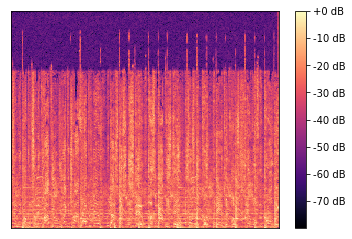

In [83]:
backToSpectro = librosa.power_to_db(sUtils.unscaleSpectro(hopRockDreamSpectro, origSpectroSize, minAmp, maxAmp))
backToPhase = sUtils.unscalePhase(hopRockDreamPhase, origSpectroSize, -math.pi, math.pi)

plt.figure()
librosa.display.specshow(backToSpectro)
plt.colorbar(format='%+2.0f dB')
plt.show()


In [84]:
backToSpectro = librosa.core.db_to_power(backToSpectro)
backToPhase = sUtils.unscalePhase(hopRockDreamPhase, origSpectroSize, -math.pi, math.pi)
invStft = np.zeros(backToSpectro.shape, dtype=np.complex_)
for i in range(invStft.shape[0]):
    for j in range(invStft.shape[1]):
        invStft[i,j] = complex(backToSpectro[i,j]*math.cos(backToPhase[i,j]), backToSpectro[i,j]*math.sin(backToPhase[i,j]))
n = len(x)
y_hat = librosa.istft(invStft, length = n)
ipd.Audio(data=y_hat[start*sr:end*sr], rate=sr)

In [85]:
librosa.output.write_wav('dreamExampleControl.wav', y_hat, sr)